In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import re
import numpy as np 
import collections
from wordcloud import WordCloud, STOPWORDS
from collections import Counter
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

sns.set_theme()
cnt = Counter()
%matplotlib inline

# To view everything
# pd.set_option('display.max_rows', None)
# pd.set_option('display.max_columns', None)
# pd.set_option('display.max_colwidth', -1)

# Part 2 Sentiment Analysis


In [ ]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer
import nltk
nltk.download('vader_lexicon')
sentiment = SentimentIntensityAnalyzer()

data['sentiment'] = data.clean_tweet4.apply(lambda x: sentiment.polarity_scores(x))
data.sentiment = data.sentiment.apply(pd.Series)['compound']

In [ ]:
#data.to_csv('f-data-sentiment.csv')

In [4]:
def get_sentimental_label(val):
  if (val <= 1.0 and val >= 0.6):
    return 'Very Positive'
  elif (val < 0.6 and val >= 0.10):
    return 'Positve'
  elif (val < 0.10 and val > - 0.10):
    return 'Neutral'
  elif ( val <= -0.10 and val > - 0.55):
    return 'Negative'
  else:
    return 'Very Negative'

data['sentiment_class'] = data['sentiment'].apply(get_sentimental_label)

In [35]:
#Looking into 2020 data, sentiment = Positive
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', -1)
d_Positive_sentiment = data[(data.sentiment_class == "Positve") & (data.year == 2020) ]#& (sdata.month== 6  )
d_Positive_sentiment[['clean_tweet4', 'sentiment', 'sentiment_class']].sort_values('sentiment', ascending=False)

C:\Users\User\anaconda3\lib\site-packages\ipykernel_launcher.py:3: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  This is separate from the ipykernel package so we can avoid doing imports until


,clean_tweet4,sentiment,sentiment_class
43940,stay safe wear face mask sandrakisic coffeetime capturestreets agameoftones shotzdelight girlsquad mirrorless citykillerz streetactivity streets vision creativeoptic singapore,0.5994,Positve
23456,oh god insomnia back tf lol,0.5994,Positve
52017,pany wife surgery god bless singapore general hospital,0.5994,Positve
16595,watched marriage story last night many emotions beautiful movie,0.5994,Positve
47317,singapore government clinics everyone gets checked national identification card gets scanned given sticker certain color lets onto floors appointments efficient course circuitbreaker circuitbreakersg,0.5994,Positve
51928,sanitise soomlab reusable mask alcohol super slow motion reused times need wait hour use singapore,0.5994,Positve
44014,blessed easter weekend everyone stay home cook order eat hot cross buns chocolate eggs stayhome easterweekend covid coronavirus,0.5994,Positve
44008,nice singapore resource site singlish humor ccb munity circuitbreaker covid plankthecurve,0.5994,Positve
43942,advanced zoom tips better video meetings groove blog,0.5994,Positve
47395,giveaway soooo long since shopping mall due covid thankfully lynk artisan managed turn house one popular shopping malls singapore puzzled,0.5994,Positve


<AxesSubplot:xlabel='month', ylabel='sentiment'>

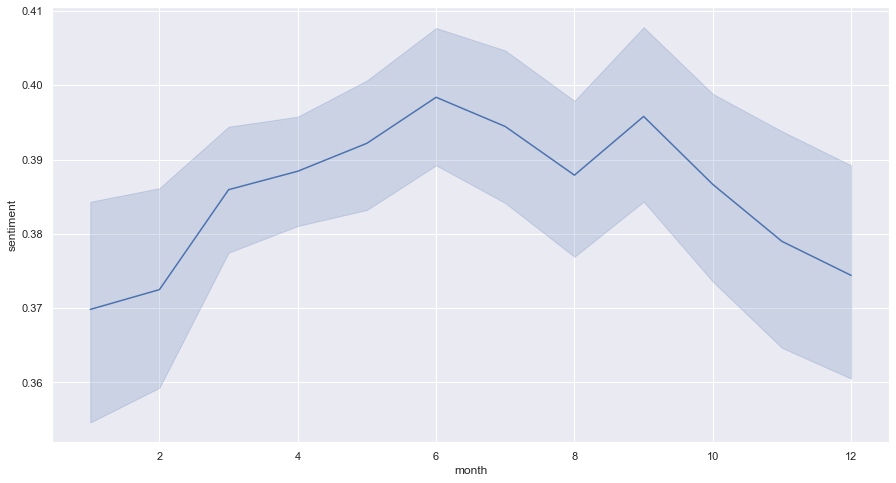

In [37]:
# Positive sentiment over the year 2020 
sns.set_theme()
plt.figure(figsize=(15,8))
sns.lineplot(x=d_Positive_sentiment.month, y=d_Positive_sentiment.sentiment)

In [38]:
#Looking into 2020 data, sentiment = Very Positive
pd.set_option('display.max_rows', None)
d_v_positive = sdata[(sdata.sentiment_class == "Very Positive")& (sdata.year == 2020) ] #& (sdata.month == 6)
d_v_positive[['clean_tweet4', 'sentiment', 'sentiment_class']].sort_values('sentiment', ascending=False)



,clean_tweet4,sentiment,sentiment_class
15577,victory efforts ifs buts victory love faith motivation win hope bigbang success effort life god believe lrgacy makehistory peace follow vision winner sport inspiration champion,0.9895,Very Positive
44398,greetings friends across globe celebrating new year festival time covid pray hope humans caring empathetic loving learn give take spread love make life even beautiful happynewyear,0.9881,Very Positive
17141,join ez job ez job employee ez job gives opportunity generate free help ez job promote advertise ez job pays usd cash vip account require investment make money truly zero investment trust us join us,0.9870,Very Positive
38370,new year wonderful day work wishing everyone guests happy new year feel like work joy spread joy love gives much happiness see kids adults entertained us happy uss,0.9868,Very Positive
22709,dear thinking personal message enquire well hope fmly well loved ones safe healthy pray emerge current situation stronger wise please take care safe,0.9856,Very Positive
50134,habits happiness judge less spread love share smile work passion let go negativity count blessings choose faith fear believe dreams respect treat people kindness things love good morning,0.9850,Very Positive
15473,happy birthday best boy kang taehyun love much talented babie love till death please stay healthy happy thanks making happy everyday first bday celebration moa txt memberstxt bighit happytaehyunday taehyun txt,0.9849,Very Positive
20569,love infinite love fair maiden love sleeping beauty need dream replenish perfection never tired true love know waiting,0.9829,Very Positive
40488,dear lord rise meet new day please let us filled spirit wherever go let us spread love joy peace goodness faithfulness let us desire like worship,0.9825,Very Positive
44743,home felt pretty special grateful family friends close heart felt celebrated loved surprise surprise lockdown felt appreciated thank everyone,0.9810,Very Positive


<AxesSubplot:xlabel='month', ylabel='sentiment'>

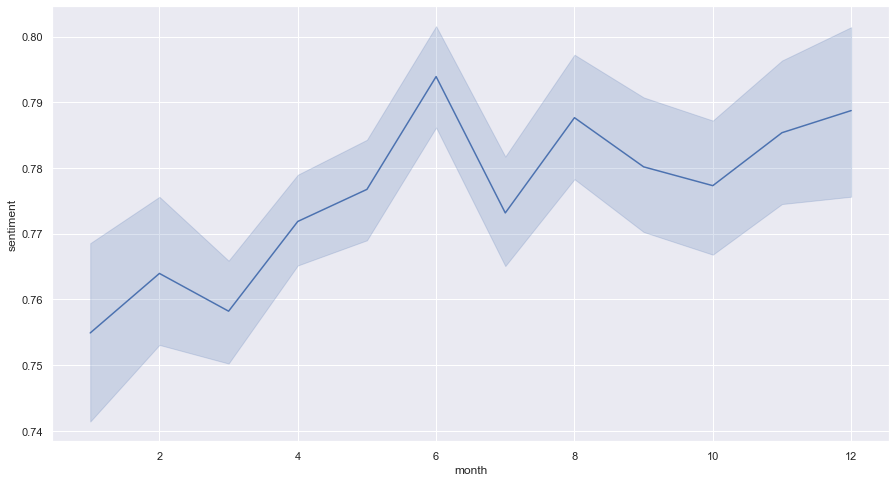

In [39]:
# Very Positive sentiment over the year 2020 
plt.figure(figsize=(15,8))
sns.lineplot(x=d_v_positive.month, y=d_v_positive.sentiment)

In [49]:
sdata.to_csv("f-sentiment_class.csv")

C:\Users\User\anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


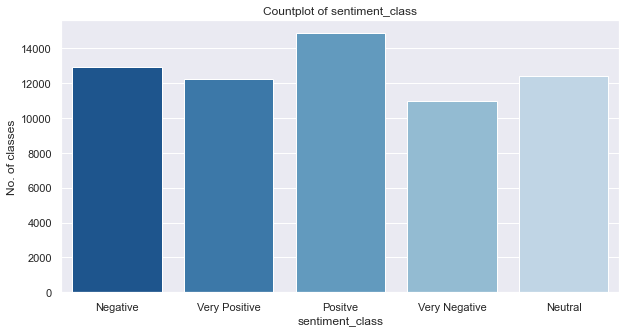

In [46]:
plt.figure(figsize = (10,5))
sns.set_palette('Blues_r')
sns.countplot(sdata['sentiment_class'])
plt.title('Countplot of sentiment_class')
plt.xlabel('sentiment_class')
plt.ylabel('No. of classes')
plt.show()

In [86]:
# New File
# tdata = pd.read_csv("final_lemmatized_data.csv")
# tdata.drop('Unnamed: 0', axis=1, inplace=True)
# tdata.head(2)

# # When I was looking into the tweet sentiment I found a lot of duplicate 
# len(sdata.clean_tweet4)

# # So I removed the duplicate tweets again! 


# # Save the file! 
# sdata.to_csv("f-sentiment_class.csv")

,date,hashtags,username,nlikes,nreplies,nretweets,search,year,month,parse_tweet
0,2019-12-29 13:54:00,[],JesusDailyTwits,1,0,0,depression,2019,12,good depression killer worship jesus try viayoutube
1,2019-12-29 12:47:00,[],Aluvrendar,67,3,6,depression,2019,12,hope blessing majli depression never return anxiety panic attack pletely disappear hope heal


In [ ]:
tdata.drop_duplicates(subset='clean_tweet4', inplace=True)
tdata.shape

### The sentiment of tweets around Q2 2020

In [20]:
# Split data 
data_19 = sdata[sdata.year == 2019]
data_20 = sdata[sdata.year == 2020]
data_21 = sdata[sdata.year == 2021]

Q2 = [4,5,6]

sdata_20_Q2 = data_20[data_20['month'].isin(Q2)]
sdata_20_Q2.head(2)

,date,hashtags,username,nlikes,nreplies,nretweets,search,clean_tweet4,year,month,check,sentiment,sentiment_class
12880,6/9/2020 23:29,[],HoIyCunty,0,0,0,self-esteem,goes self esteem,2020,6,mh,0.0000,Neutral
12933,6/26/2020 18:11,[],tinAY_93,4,0,0,depression,depression like war either win die trying,2020,6,mh,-0.7351,Very Negative


<AxesSubplot:title={'center':'Sentiment for Q2 of 2020 (during circuit breaker)'}, xlabel='month', ylabel='sentiment'>

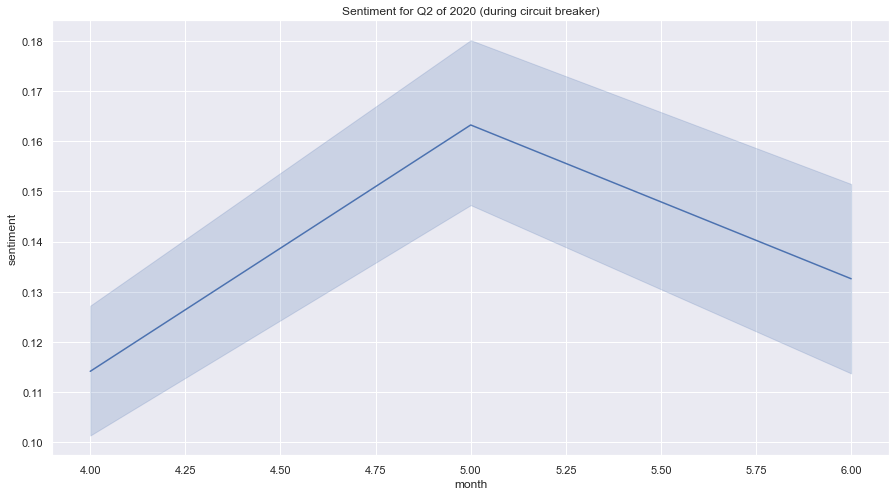

In [25]:
# Very Positive sentiment over the year 2020 
plt.figure(figsize=(15,8))
sns.set_theme()
plt.title("Sentiment for Q2 of 2020 (during circuit breaker)")
sns.lineplot(x=sdata_20_Q2.month, y=sdata_20_Q2.sentiment)

In [63]:
# Looking in to sdata_20_Q2 data
d_v_positive2 = sdata_20_Q2[(sdata_20_Q2.sentiment_class == "Very Positive") ] #& (sdata.month == 6)
d_v_positive2[['clean_tweet4', 'sentiment', 'sentiment_class']].sort_values('sentiment', ascending=False)

,clean_tweet4,sentiment,sentiment_class
44398,greetings friends across globe celebrating new year festival time covid pray hope humans caring empathetic loving learn give take spread love make life even beautiful happynewyear,0.9881,Very Positive
22709,dear thinking personal message enquire well hope fmly well loved ones safe healthy pray emerge current situation stronger wise please take care safe,0.9856,Very Positive
50134,habits happiness judge less spread love share smile work passion let go negativity count blessings choose faith fear believe dreams respect treat people kindness things love good morning,0.9850,Very Positive
44743,home felt pretty special grateful family friends close heart felt celebrated loved surprise surprise lockdown felt appreciated thank everyone,0.9810,Very Positive
50049,oh wow another excellent release bybenadamsuk goes fav repeats song kindof stimulates positivities around title said certainly ben made major progress amazing contribution music lockdown esp loving tht euphonious vocal,0.9807,Very Positive
19061,well versed educated certain field god blessed way give credit god prove work bless creations using knowledge mon good help graciously nudge people right direction,0.9781,Very Positive
45652,armys hope everyone well circuit breaker friend sg go channel tele bts bt stuff helping share channel super friendly army makes whole go process super hassle free,0.9774,Very Positive
43452,free cheesecake free chawanmushi free tori karaage free california maki free soft drinks free delivery gst absorbed yes circuit breaker period promotion save get another,0.9769,Very Positive
47833,vs happy birthday one loves perform keep straight face always happy fun love much ikphoto happybirthday jaynekuan jbabies stayhome circuitbreaker love,0.9769,Very Positive
22698,thoughtful sweetheart always concerned armys wellbeing always sincere heartfelt words love deserve good things world park jimin love jiminbts twt,0.9761,Very Positive


In [64]:
# Looking in to sdata_20_Q2 data
d_Positive2 = sdata_20_Q2[(sdata_20_Q2.sentiment_class == "Positve")  ]#& (sdata.month== 6  )
d_Positive2[['clean_tweet4', 'sentiment', 'sentiment_class']].sort_values('sentiment', ascending=False)

,clean_tweet4,sentiment,sentiment_class
47171,rarely post selfie boomerangs one hoping everyone well circuit breaker singapore,0.5994,Positve
49640,phase starts today meaning opening restaurant people may god bless us,0.5994,Positve
48255,bright vision hospital singapore,0.5994,Positve
44517,selling super hydrating mask geoskin box pcs get shopee shopeesg,0.5994,Positve
45649,loving new mask duty fortable staysafeeveryone loveyouallguys,0.5994,Positve
44428,high school principal chris hayward shares learners develop ib learner profile attributes engaged home based learning isspride ibworldschool ibtogether internationalschool covid ed sgunited onlinelearning,0.5994,Positve
45633,everyone healthsystem gets exposed benefits efficiencies telehealth telemedicinr dominant way access primarycare covid coronavirus digitalhealth healthtech,0.5994,Positve
43942,advanced zoom tips better video meetings groove blog,0.5994,Positve
43940,stay safe wear face mask sandrakisic coffeetime capturestreets agameoftones shotzdelight girlsquad mirrorless citykillerz streetactivity streets vision creativeoptic singapore,0.5994,Positve
45586,selamat hari lahir beb syazjamal lt look development photos singapore sydney kl back singapore plus social distancing factor friends reaching publication goals saya cinta mu,0.5994,Positve


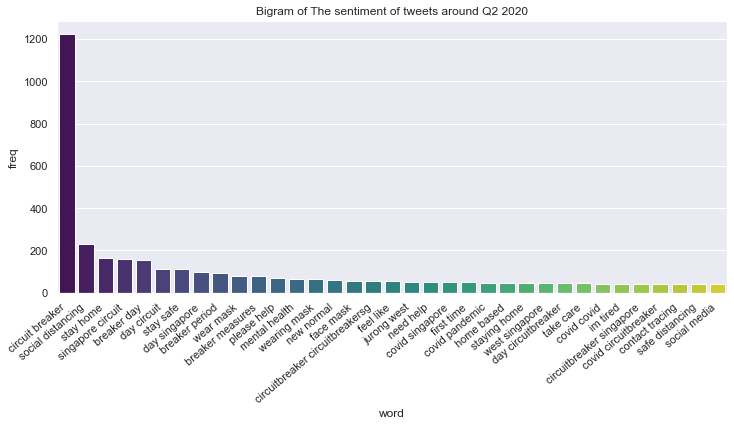

In [68]:
# Bigram of The sentiment of tweets around Q2 2020

cv = CountVectorizer(analyzer='word', ngram_range=(2, 2))
bow = cv.fit_transform(sdata_20_Q2.clean_tweet4.values.astype('U'))
word_freq = dict(zip(cv.get_feature_names(), np.asarray(bow.sum(axis=0)).ravel()))
word_counter = collections.Counter(word_freq)
word_counter_df = pd.DataFrame(word_counter.most_common(35), columns = ['word', 'freq'])

# Visualzie the vectorized tweets 

fig, ax = plt.subplots(figsize=(12, 5))
bar_freq_word = sns.barplot(x="word", y="freq", data=word_counter_df, palette="viridis", ax=ax)
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
plt.title("Bigram of The sentiment of tweets around Q2 2020")

plt.show();

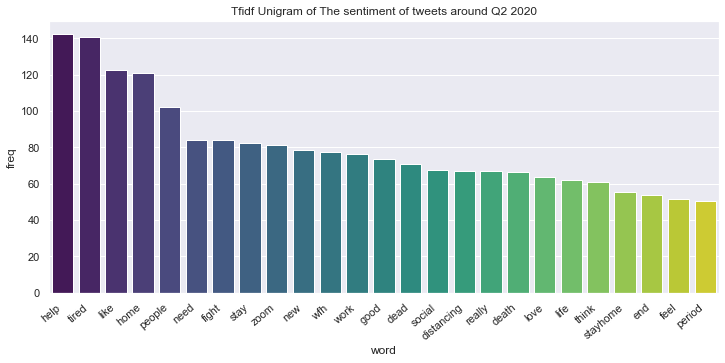

In [80]:
# Tfidf Unigram of The sentiment of tweets around Q2 2020
from sklearn.feature_extraction import text 
my_additional_sw = [ 'im', 'day', 'us', 'get', 'go', 'got',
                    'singapore', 'circuit', 'breaker', 'covid', 'lockdown', 'circuitbreaker', 
                    'mask', 'time', 'phase', 'days', 'pandemic', 'quarantine', 'flight', 'going',
                   'coronavirus', 'know', 'want', 'today']

stop_words = text.ENGLISH_STOP_WORDS.union(my_additional_sw)


Tfidf = TfidfVectorizer(stop_words=stop_words)
bow = Tfidf.fit_transform(sdata_20_Q2.clean_tweet4.values.astype('U'))
word_freq = dict(zip(Tfidf.get_feature_names(), np.asarray(bow.sum(axis=0)).ravel()))
word_counter = collections.Counter(word_freq)
word_counter_df = pd.DataFrame(word_counter.most_common(25), columns = ['word', 'freq'])

# Visualzie the vectorized tweets 
fig, ax = plt.subplots(figsize=(12, 5))
bar_freq_word = sns.barplot(x="word", y="freq", data=word_counter_df, palette="viridis", ax=ax)
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
plt.title("Tfidf Unigram of The sentiment of tweets around Q2 2020")
plt.show()

In [5]:
sdata = pd.read_csv("final-clean-sentiment_class.csv")
sdata.drop('Unnamed: 0', axis=1, inplace=True)
sdata.head(2)

,date,hashtags,username,nlikes,nreplies,nretweets,search,clean_tweet4,year,month,check,sentiment,sentiment_class
0,12/29/2019 13:54,[],JesusDailyTwits,1,0,0,depression,best depression killer worshipping jesus try v...,2019,12,mh,-0.2960,Negative
1,12/29/2019 12:47,[],Aluvrendar,67,3,6,depression,hope blessings majlis depression never return ...,2019,12,mh,0.6149,Very Positive


C:\Users\User\anaconda3\lib\site-packages\ipykernel_launcher.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """


<AxesSubplot:xlabel='date', ylabel='sentiment'>

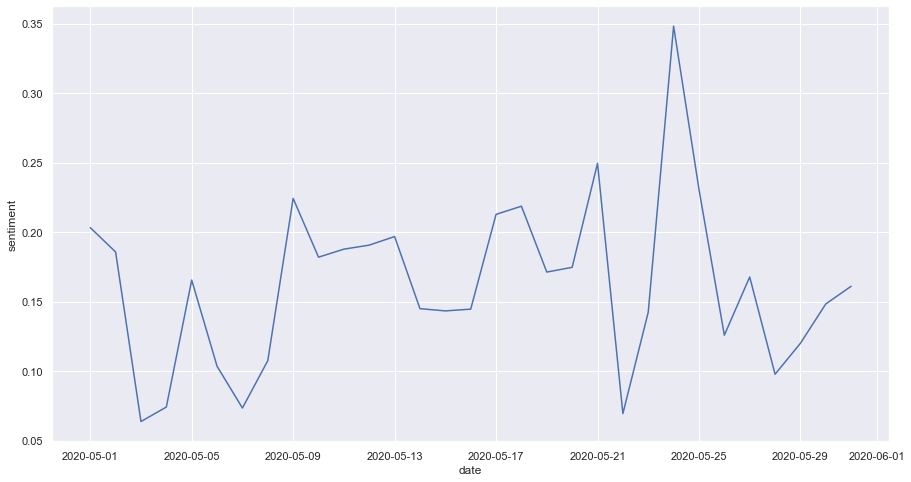

In [51]:
# Very Positive sentiment over the year 2020
plt.figure(figsize=(15,8))
sns.set_theme()

sns.lineplot(x=sdata[sdata.year==2020][sdata.month==5].date, y=sdata['sentiment'], ci=None)


<AxesSubplot:xlabel='date', ylabel='sentiment'>

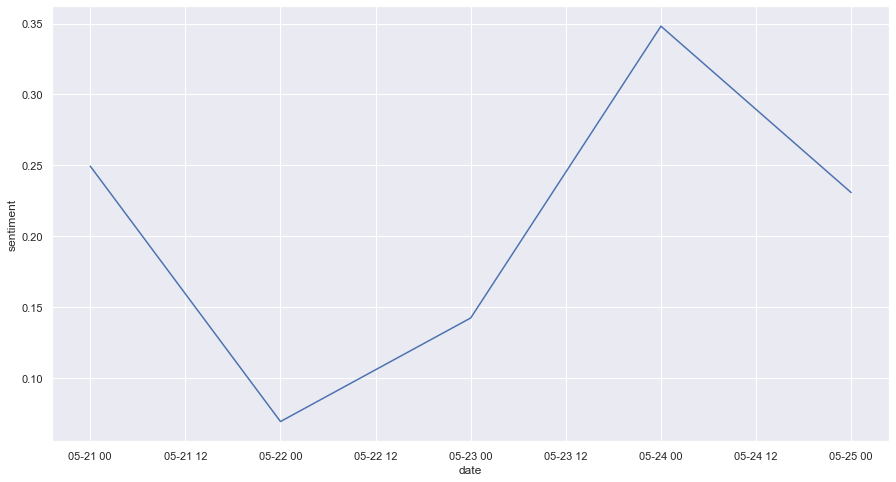

In [55]:
# Find out the peak sentiment data 

startdate = pd.to_datetime("2020-5-21").date()
enddate = pd.to_datetime("2020-5-25").date()
df= sdata[sdata.date.between(startdate, enddate)]
#df = sdata[(sdata['date'] > '2020-03-01') & (sdata['date'] <= '2020-06-10')]

plt.figure(figsize=(15,8))
sns.set_theme()
sns.lineplot(x=df.date, y=df['sentiment'], ci=None)

In [60]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', -1)
highest_date = pd.to_datetime("2020-5-24").date()

df.loc[df.date==highest_date][['clean_tweet4', 'sentiment', 'sentiment_class']].sort_values('sentiment', ascending=False)
#d_Positive2[['clean_tweet4', 'sentiment', 'sentiment_class']].sort_values('sentiment', ascending=False)

C:\Users\User\anaconda3\lib\site-packages\ipykernel_launcher.py:3: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  This is separate from the ipykernel package so we can avoid doing imports until


,clean_tweet4,sentiment,sentiment_class
19154,attending conference anurag bhaiya congratulations blood buddha proud success like help next project anurag bhaiya mentioned please connect,0.9531,Very Positive
48061,dispite covid earning badly afffected love job till extending care love ones need although im willing happy hari raya aidilfitri muslim friends,0.9460,Very Positive
48047,selamat hari raya period let stay safe keep visiting digital covid prevent us celebrating joyous occassion loved ones inpixelhaus hariraya raya,0.9403,Very Positive
48104,aidilfitri bit different year corona virus specially missed beloved son first eid unable attending bangladesh celebrate eid together even eid day heart always share joys pleasure,0.9313,Very Positive
48044,wishing selamat hari raya muslim friends followers twitter hope good one despite covid importantly always take extra precautions stay safe sincerely,0.9305,Very Positive
48046,pseudoscops team like wishes muslim friends salamat hari raya aidilfitri wonderful day ahead continue celebrate home keep social distancing pseudoscops,0.9274,Very Positive
19148,grocery distribution friday hari raya thankfully number volunteers help share duty joke humid balmy afternoon good workout maybe start,0.9022,Very Positive
19151,give girl personal bank acc number really want appreciate girl pleted th even kinda situations around living place wanna help much later best higher studies,0.8950,Very Positive
48084,see good everything covid many silly fun videos family celebrating raya spread love hate,0.8885,Very Positive
48082,nice lah getting lighter yea circuit breaker making us lighter haha looks like buy new stocks makeup haha,0.8834,Very Positive
